In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster, HeatMap
from folium import Marker
import pywt
import pickle


In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score
import xgboost as xg
from sklearn.svm import SVR

In [3]:
from keras.models import Sequential
from keras.layers import Dense
from keras.models import model_from_json
from keras.models import load_model

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
from jupyterthemes import jtplot
jtplot.style(theme="monokai", context="notebook", ticks=True, grid=False)

In [6]:
df_data = pd.read_csv(r"data/mawp24.csv")[['TMSTAMP', 'StnID', 'MinAir_T', 'AvgAir_T', 'MaxAir_T',
                                     'AvgSoil_T05', 'Avg_Soil_TP20_TempC', 'Avg_Soil_TP50_TempC','Avg_Soil_TP100_TempC']]

In [7]:
df_meta_data = pd.read_excel(r"data/NetworkInfo.xlsx")[["StnID", "StationName", "LatDD", "LongDD"]]

In [8]:
df_data["TMSTAMP"] = pd.to_datetime(df_data["TMSTAMP"])
df_data.rename(columns = {"TMSTAMP":"date"}, inplace= True)

In [9]:
#df_meta_data = this is a meta data that describes the locations
#df_final = this is a data frame that describes everything
#df_count = the number of data points in each location

# INFO

### raw data

In [10]:
df_data

,date,StnID,MinAir_T,AvgAir_T,MaxAir_T,AvgSoil_T05,Avg_Soil_TP20_TempC,Avg_Soil_TP50_TempC,Avg_Soil_TP100_TempC
0,2016-01-01,201,-14.710,-9.880,-4.705,-0.046,NaN,NaN,NaN
1,2016-01-02,201,-9.690,-5.869,-4.157,-0.051,NaN,NaN,NaN
2,2016-01-03,201,-9.460,-6.031,-2.216,-0.016,NaN,NaN,NaN
3,2016-01-04,201,-12.410,-8.980,-4.153,-0.026,NaN,NaN,NaN
4,2016-01-05,201,-12.300,-7.100,-3.403,-0.079,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
124037,2019-10-28,740,-6.196,-3.740,-0.635,2.623,5.186,6.762,7.544
124038,2019-10-29,740,-10.340,-6.265,-1.465,0.846,4.077,6.599,7.484
124039,2019-10-30,740,-10.740,-7.912,-5.956,0.222,3.402,6.259,7.349
124040,2019-10-31,740,-13.090,-7.853,-2.728,0.298,3.130,5.911,7.157


In [11]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124042 entries, 0 to 124041
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   date                  124042 non-null  datetime64[ns]
 1   StnID                 124042 non-null  int64         
 2   MinAir_T              123934 non-null  float64       
 3   AvgAir_T              123962 non-null  float64       
 4   MaxAir_T              123923 non-null  float64       
 5   AvgSoil_T05           113863 non-null  float64       
 6   Avg_Soil_TP20_TempC   108517 non-null  float64       
 7   Avg_Soil_TP50_TempC   62176 non-null   float64       
 8   Avg_Soil_TP100_TempC  54173 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 8.5 MB


In [12]:
df_data.isnull().sum()

date                        0
StnID                       0
MinAir_T                  108
AvgAir_T                   80
MaxAir_T                  119
AvgSoil_T05             10179
Avg_Soil_TP20_TempC     15525
Avg_Soil_TP50_TempC     61866
Avg_Soil_TP100_TempC    69869
dtype: int64

In [13]:
df_meta_data.rename(columns = {"LatDD": "lat", "LongDD": "lon"}, inplace = True)

In [14]:
df_meta_data.to_excel(r"data/NetworkInfo_final.xlsx", index = False)

### raw meta data

In [15]:
df_meta_data

,StnID,StationName,lat,lon
0,201,Treherne,49.6350,-98.6760
1,202,Starbuck,49.7680,-97.6640
2,203,St. Pierre,49.4490,-96.9630
3,204,Gladstone,50.1420,-98.9500
4,205,Moosehorn,51.3330,-98.5980
...,...,...,...,...
104,559,Holland,49.5910,-98.9840
105,560,Prawda,49.6477,-95.7241
106,561,Sprague Lake,49.3325,-95.4056
107,562,Poplarfield,50.8858,-97.6030


### combined raw data and meta data without Null values

In [16]:
df_final = pd.merge(df_data, df_meta_data, on = "StnID")
df_final = df_final[["date","StationName", "lat", "lon", "MinAir_T", "AvgAir_T", "MaxAir_T", "AvgSoil_T05", 
                     "Avg_Soil_TP20_TempC", "Avg_Soil_TP50_TempC", "Avg_Soil_TP100_TempC"]]

In [17]:
df_final.dropna(inplace = True)

In [18]:
df_final.reset_index(drop = True, inplace=True)
df_final["date"] = pd.to_datetime(df_final["date"], format='%Y%m%d')

In [19]:
df_final = df_final.rename(columns = {"AvgAir_T" : "AvgAir_T_TempC", "MaxAir_T":"MaxAir_T_TempC","MinAir_T":"MinAir_T_TempC",
                                      "AvgSoil_T05": "Avg_Soil_TP05_TempC"})
df_final

,date,StationName,lat,lon,MinAir_T_TempC,AvgAir_T_TempC,MaxAir_T_TempC,Avg_Soil_TP05_TempC,Avg_Soil_TP20_TempC,Avg_Soil_TP50_TempC,Avg_Soil_TP100_TempC
0,2018-06-29,Treherne,49.635,-98.676,11.920,21.530,29.160,21.340,17.870,16.120,11.270
1,2018-06-30,Treherne,49.635,-98.676,14.790,20.180,24.510,22.270,18.460,16.410,11.370
2,2018-07-01,Treherne,49.635,-98.676,13.560,18.570,22.860,21.170,18.530,16.570,11.470
3,2018-07-02,Treherne,49.635,-98.676,12.060,17.750,25.600,20.140,17.920,16.390,11.580
4,2018-07-03,Treherne,49.635,-98.676,12.880,18.670,25.240,20.200,17.610,16.150,11.670
...,...,...,...,...,...,...,...,...,...,...,...
44226,2019-10-28,Bede,49.402,-100.930,-6.196,-3.740,-0.635,2.623,5.186,6.762,7.544
44227,2019-10-29,Bede,49.402,-100.930,-10.340,-6.265,-1.465,0.846,4.077,6.599,7.484
44228,2019-10-30,Bede,49.402,-100.930,-10.740,-7.912,-5.956,0.222,3.402,6.259,7.349
44229,2019-10-31,Bede,49.402,-100.930,-13.090,-7.853,-2.728,0.298,3.130,5.911,7.157


In [20]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44231 entries, 0 to 44230
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  44231 non-null  datetime64[ns]
 1   StationName           44231 non-null  object        
 2   lat                   44231 non-null  float64       
 3   lon                   44231 non-null  float64       
 4   MinAir_T_TempC        44231 non-null  float64       
 5   AvgAir_T_TempC        44231 non-null  float64       
 6   MaxAir_T_TempC        44231 non-null  float64       
 7   Avg_Soil_TP05_TempC   44231 non-null  float64       
 8   Avg_Soil_TP20_TempC   44231 non-null  float64       
 9   Avg_Soil_TP50_TempC   44231 non-null  float64       
 10  Avg_Soil_TP100_TempC  44231 non-null  float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 3.7+ MB


In [21]:
df_final.describe()

,lat,lon,MinAir_T_TempC,AvgAir_T_TempC,MaxAir_T_TempC,Avg_Soil_TP05_TempC,Avg_Soil_TP20_TempC,Avg_Soil_TP50_TempC,Avg_Soil_TP100_TempC
count,44231.000000,44231.000000,44231.000000,44231.000000,44231.000000,44231.000000,44231.000000,44231.000000,44231.000000
mean,50.044834,-99.095163,-2.331063,3.630872,9.064565,7.535352,7.704039,7.454777,7.343314
std,0.783646,1.591847,13.332358,13.802397,14.893674,9.279825,7.684008,6.254761,4.912579
min,49.008000,-101.490000,-47.100000,-38.600000,-31.850000,-17.060000,-14.220000,-12.120000,-5.158000
25%,49.402000,-100.538700,-10.410000,-5.795000,-1.704500,-0.574500,1.114000,1.757000,2.703000
50%,49.885000,-99.248000,-0.119000,5.280000,10.800000,6.283000,6.762000,6.976000,7.398000
75%,50.507000,-97.712000,8.500000,15.590000,22.100000,16.340000,14.720000,13.290000,11.940000
max,52.347200,-95.724100,22.440000,29.760000,39.960000,27.830000,27.890000,21.960000,23.680000


### df_count = the number of data points in each location that has all the variables (MinAir_T, AvgAir_T, MaxAir_T, AvgSoil_T05,Avg_Soil_TP20_TempC, Avg_Soil_TP50_TempC, Avg_Soil_TP100_TempC)

In [22]:
df_count = df_final.groupby(["StationName", "lat", "lon"]).count()
df_count

,,,date,MinAir_T_TempC,AvgAir_T_TempC,MaxAir_T_TempC,Avg_Soil_TP05_TempC,Avg_Soil_TP20_TempC,Avg_Soil_TP50_TempC,Avg_Soil_TP100_TempC
StationName,lat,lon,,,,,,,,
Alexander,49.8134,-100.3721,433,433,433,433,433,433,433,433
Alonsa,50.6980,-99.0680,53,53,53,53,53,53,53,53
Altona,49.0950,-97.5280,484,484,484,484,484,484,484,484
Arborg,50.9040,-97.2730,177,177,177,177,177,177,177,177
Argue,49.4360,-100.3080,465,465,465,465,465,465,465,465
...,...,...,...,...,...,...,...,...,...,...
Wawanesa,49.6360,-99.6620,154,154,154,154,154,154,154,154
Windygates,49.0080,-98.3800,491,491,491,491,491,491,491,491
Winkler,49.1220,-97.9320,491,491,491,491,491,491,491,491


In [23]:
station_names = []
number_of_dates = []
for i in range(0,104):
    station_names.append(df_count.index[i][0])
    number_of_dates.append(df_count.iloc[i,0])

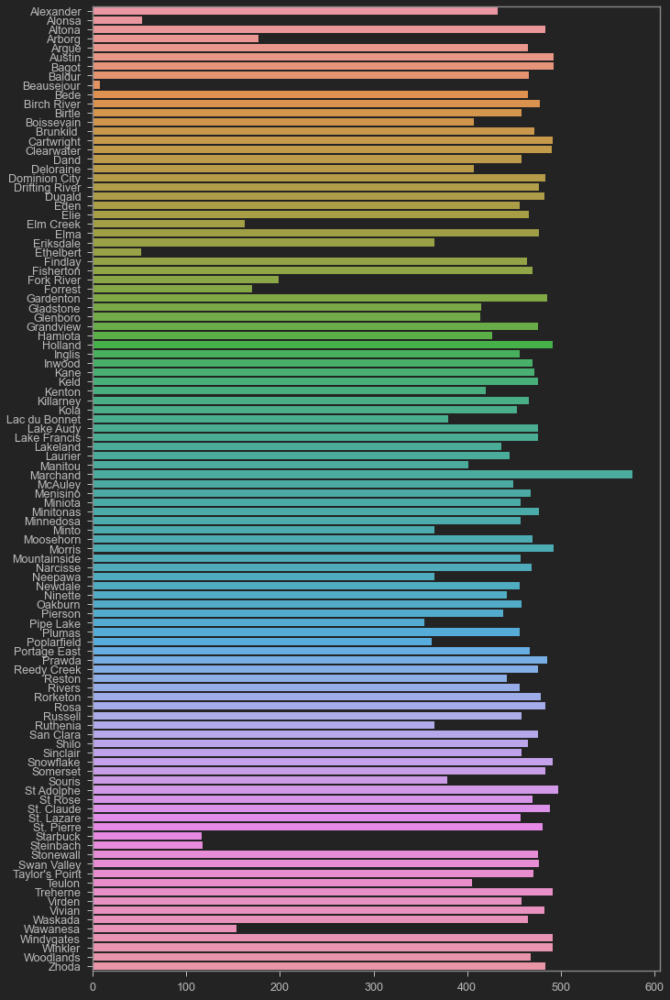

In [24]:
fig, axes = plt.subplots(figsize = (10,15))
plt.rcParams.update({"font.size":1})
fig = sns.barplot(y = station_names, x = number_of_dates)
plt.tight_layout()
fig

In [25]:
def GetCount(city_name):
    _ = df_meta_data[df_meta_data["StationName"] == city_name].values.tolist()[0]
    return df_count.loc[_,:]

In [26]:
c = GetCount("Birch River")
c

,,,date,MinAir_T_TempC,AvgAir_T_TempC,MaxAir_T_TempC,Avg_Soil_TP05_TempC,Avg_Soil_TP20_TempC,Avg_Soil_TP50_TempC,Avg_Soil_TP100_TempC
StationName,lat,lon,,,,,,,,
Birch River,52.3472,-101.1099,478,478,478,478,478,478,478,478


# Base map

In [27]:
sw = [49.152433, -102.185820]
ne = [59.511477, -88.217413]
winnipeg = (49.900497437,-97.139312744)
base_map = folium.Map(location = winnipeg, zoom_start=4.7, min_zoom=4.7)
base_map.fit_bounds([sw,ne])
def air_PlotDot(point):
    folium.CircleMarker(location = [point.lat, point.lon],
                        radius = 2,
                        tooltip=f'<b>station_name: </b>{str(point["StationName"])}'
                                f'<br></br>'f'<b>location: </b>{str(point[["lat", "lon"]].tolist())}',
                        popup=f'<b>station_name: </b>{str(point["StationName"])}'
                              f'<br></br>'f'<b>location: </b>{str(point[["lat", "lon"]].tolist())}',
                        fill_color = "#000000"
                        ).add_to(base_map)
df_meta_data.apply(air_PlotDot, axis=1)
base_map

# How is the situation in each city with regard to the date variable

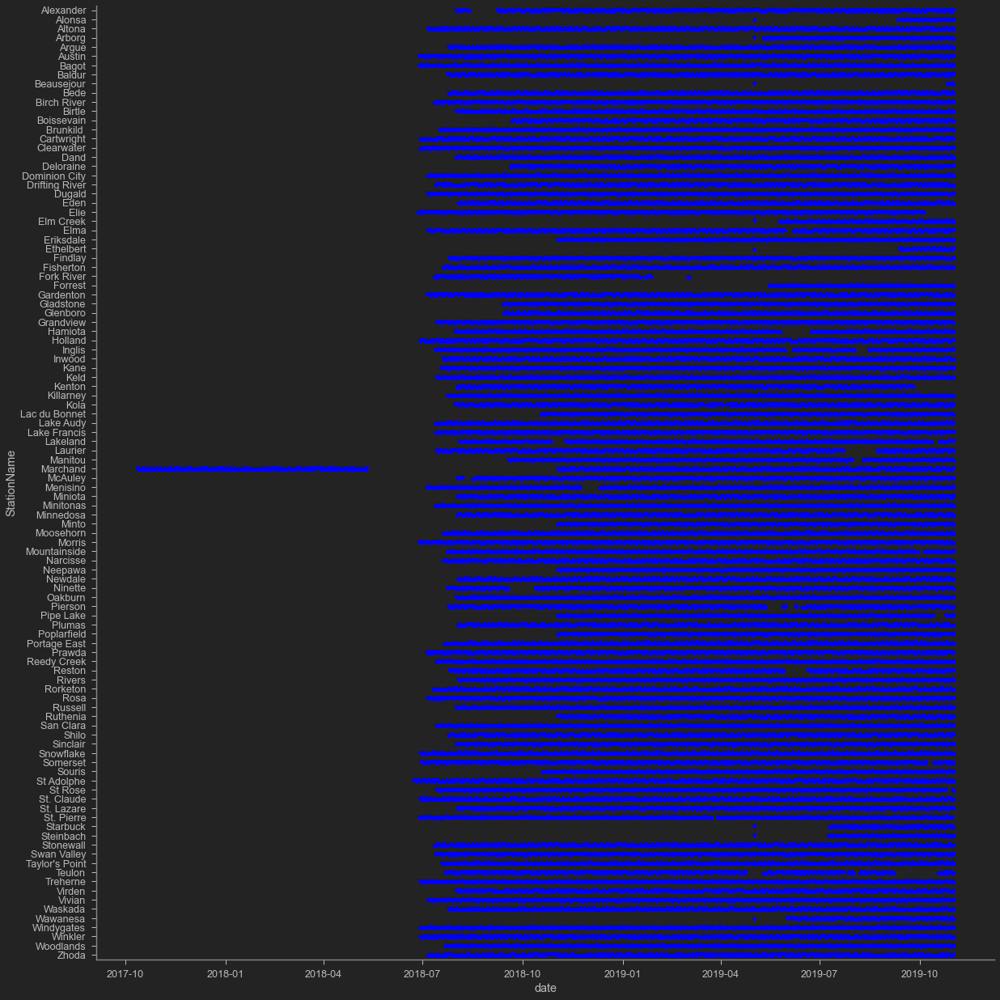

In [28]:
fig_city_timeseries = sns.catplot(y = "StationName", x = "date", data = df_final.sort_values("StationName"),
                                  aspect = 1, height = 17, color = "blue")
fig_city_timeseries

# time series plot of each city

In [29]:
df_timeseries = pd.pivot_table(df_final, values = ["MinAir_T_TempC", "AvgAir_T_TempC", "MaxAir_T_TempC", "Avg_Soil_TP05_TempC", 
                                                   "Avg_Soil_TP20_TempC","Avg_Soil_TP50_TempC", "Avg_Soil_TP100_TempC"], index = "date", 
                               columns = ["StationName"])
df_timeseries = df_timeseries[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC", "Avg_Soil_TP05_TempC",
                               "Avg_Soil_TP20_TempC", "Avg_Soil_TP50_TempC", "Avg_Soil_TP100_TempC"]]
df_timeseries

AvgAir_T_TempC                                                   \
StationName      Alexander Alonsa Altona Arborg  Argue Austin  Bagot Baldur   
date                                                                          
2017-10-12             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2017-10-13             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2017-10-14             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2017-10-15             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2017-10-16             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
...                    ...    ...    ...    ...    ...    ...    ...    ...   
2019-10-28          -3.829 -2.364 -0.056 -1.354 -3.650 -1.399 -1.269 -2.680   
2019-10-29          -6.350 -5.364 -2.520 -3.933 -6.166 -4.178 -3.858 -4.941   
2019-10-30          -7.876 -6.092 -5.247 -6.160 -7.880 -6.572 -6.333 -7.046   
2019-10-31          -7.899 -5.839 -5.613 -4.965 -8.000 -6.495 -6.174 -7.222   
2019-11-01          -2.714 -2.677 -2.315 -3.680 -1.774 -2.577 -2.752 -2.478   

                               ... Avg_Soil_TP100_TempC                  \
StationName Beausejour   Bede  ...               Teulon Treherne Virden   
date                           ...                                        
2017-10-12         NaN    NaN  ...                  NaN      NaN    NaN   
2017-10-13         NaN    NaN  ...                  NaN      NaN    NaN   
2017-10-14         NaN    NaN  ...                  NaN      NaN    NaN   
2017-10-15         NaN    NaN  ...                  NaN      NaN    NaN   
2017-10-16         NaN    NaN  ...                  NaN      NaN    NaN   
...                ...    ...  ...                  ...      ...    ...   
2019-10-28      -0.343 -3.740  ...                7.449    7.492  6.818   
2019-10-29      -3.439 -6.265  ...                7.383    7.460  6.733   
2019-10-30      -4.888 -7.912  ...                7.291    7.398  6.508   
2019-10-31      -6.353 -7.853  ...                7.152    7.291  6.237   
2019-11-01      -2.882 -1.878  ...                6.997    7.151  5.980   

                                                                         
StationName Vivian Waskada Wawanesa Windygates Winkler Woodlands  Zhoda  
date                                                                     
2017-10-12     NaN     NaN      NaN        NaN     NaN       NaN    NaN  
2017-10-13     NaN     NaN      NaN        NaN     NaN       NaN    NaN  
2017-10-14     NaN     NaN      NaN        NaN     NaN       NaN    NaN  
2017-10-15     NaN     NaN      NaN        NaN     NaN       NaN    NaN  
2017-10-16     NaN     NaN      NaN        NaN     NaN       NaN    NaN  
...            ...     ...      ...        ...     ...       ...    ...  
2019-10-28   8.370   7.677    8.240       9.69   7.580     8.250  8.320  
2019-10-29   8.310   7.594    8.160       9.64   7.572     8.180  8.270  
2019-10-30   8.240   7.504    8.050       9.59   7.515     8.100  8.140  
2019-10-31     NaN   7.380    7.907       9.54   7.392     7.982  7.936  
2019-11-01   7.996   7.232    7.750       9.47   7.227     7.858  7.697  

[709 rows x 728 columns]

In [30]:
df_timeseries["AvgAir_T_TempC"]["Arborg"]

date
2017-10-12      NaN
2017-10-13      NaN
2017-10-14      NaN
2017-10-15      NaN
2017-10-16      NaN
              ...  
2019-10-28   -1.354
2019-10-29   -3.933
2019-10-30   -6.160
2019-10-31   -4.965
2019-11-01   -3.680
Name: Arborg, Length: 709, dtype: float64

In [31]:
def TimeseriesPlotSimple(param, city, df):
    plt.plot(df[param][city])
    plt.xlabel("Date")
    plt.ylabel(param)
    plt.title(city)
    plt.xticks(rotation=45)
    plt.tight_layout()

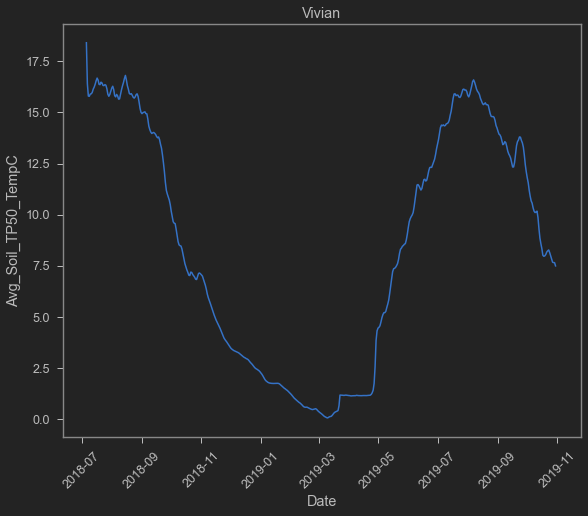

In [32]:
TimeseriesPlotSimple("Avg_Soil_TP50_TempC", "Vivian", df_timeseries)

# stating our goal

### the soil temperature at the depth of 5, 20, 50, 100
### dates : 2019-10-30,  2019-10-31, 2019-11-01

In [33]:
df_timeseries_final = df_timeseries["2019-9-1":"2019-11-01"].dropna(axis=1)
df_timeseries_final

AvgAir_T_TempC                                                  \
StationName      Alexander  Altona  Arborg   Argue  Austin   Bagot  Baldur   
date                                                                         
2019-09-01          15.960  15.320  13.700  16.480  14.610  13.810  15.790   
2019-09-02          16.680  17.150  14.260  16.230  16.040  15.990  15.900   
2019-09-03          10.820  11.390  10.200  11.340  11.050  10.820  10.050   
2019-09-04          12.310  13.160  11.270  11.710  12.320  11.930  12.620   
2019-09-05          15.070  14.410  14.950  15.530  15.730  15.000  14.480   
...                    ...     ...     ...     ...     ...     ...     ...   
2019-10-28          -3.829  -0.056  -1.354  -3.650  -1.399  -1.269  -2.680   
2019-10-29          -6.350  -2.520  -3.933  -6.166  -4.178  -3.858  -4.941   
2019-10-30          -7.876  -5.247  -6.160  -7.880  -6.572  -6.333  -7.046   
2019-10-31          -7.899  -5.613  -4.965  -8.000  -6.495  -6.174  -7.222   
2019-11-01          -2.714  -2.315  -3.680  -1.774  -2.577  -2.752  -2.478   

                                         ... Avg_Soil_TP100_TempC  \
StationName    Bede Birch River  Birtle  ...          Swan Valley   
date                                     ...                        
2019-09-01   17.030      13.640  13.710  ...               11.490   
2019-09-02   16.300      11.380  14.840  ...               11.450   
2019-09-03   12.170       6.928   9.640  ...               11.430   
2019-09-04   12.160      12.310  10.700  ...               11.390   
2019-09-05   15.130      14.510  14.420  ...               11.320   
...             ...         ...     ...  ...                  ...   
2019-10-28   -3.740      -4.018  -5.660  ...                7.884   
2019-10-29   -6.265      -5.111  -8.190  ...                7.803   
2019-10-30   -7.912      -6.451  -8.810  ...                7.706   
2019-10-31   -7.853      -4.606  -9.310  ...                7.600   
2019-11-01   -1.878      -2.675  -4.363  ...                7.480   

                                                                         \
StationName Taylor's Point Treherne  Virden Waskada Wawanesa Windygates   
date                                                                      
2019-09-01          12.520   12.820  15.550  11.960   14.830      11.44   
2019-09-02          12.480   12.740  15.430  11.900   14.710      11.39   
2019-09-03          12.470   12.670  15.380  11.870   14.650      11.34   
2019-09-04          12.440   12.630  15.300  11.860   14.610      11.31   
2019-09-05          12.320   12.550  15.080  11.830   14.510      11.27   
...                    ...      ...     ...     ...      ...        ...   
2019-10-28           7.382    7.492   6.818   7.677    8.240       9.69   
2019-10-29           7.327    7.460   6.733   7.594    8.160       9.64   
2019-10-30           7.214    7.398   6.508   7.504    8.050       9.59   
2019-10-31           7.073    7.291   6.237   7.380    7.907       9.54   
2019-11-01           6.931    7.151   5.980   7.232    7.750       9.47   

                                       
StationName Winkler Woodlands   Zhoda  
date                                   
2019-09-01   13.010    12.010  13.890  
2019-09-02   12.930    11.960  13.770  
2019-09-03   12.880    11.920  13.670  
2019-09-04   12.840    11.920  13.580  
2019-09-05   12.750    11.880  13.470  
...             ...       ...     ...  
2019-10-28    7.580     8.250   8.320  
2019-10-29    7.572     8.180   8.270  
2019-10-30    7.515     8.100   8.140  
2019-10-31    7.392     7.982   7.936  
2019-11-01    7.227     7.858   7.697  

[62 rows x 595 columns]

### the name of cities that has all the needed values between "2019-9-1":"2019-11-01"

In [34]:
final_station_names = []
for i in range(0, 595):
    final_station_names.append(df_timeseries_final.columns[i][1])
final_station_names = set(final_station_names)
final_station_names = list(final_station_names)
len(final_station_names)

85

In [35]:
final_station_names

['Arborg',
 'Oakburn',
 'Kane',
 'Plumas',
 'Hamiota',
 'Alexander',
 'Gladstone',
 'Eden',
 'Virden',
 'Austin',
 'Prawda',
 'Miniota',
 'Grandview',
 'Sinclair',
 'Poplarfield',
 'Bagot',
 'Zhoda',
 'Birch River',
 'Findlay',
 'Manitou',
 'Shilo',
 'Laurier',
 'Stonewall',
 'Snowflake',
 'Waskada',
 'Boissevain',
 'Starbuck',
 'Ruthenia',
 'Baldur',
 'Menisino',
 'Wawanesa',
 'Elma',
 'Holland',
 'Portage East',
 'San Clara',
 'Glenboro',
 'Minitonas',
 'Marchand',
 'Minto',
 'Russell',
 'Kola',
 'Bede',
 'Woodlands',
 'St Adolphe',
 'Argue',
 'Clearwater',
 'Keld',
 'Deloraine',
 'Inwood',
 'McAuley',
 'Elm Creek',
 'Killarney',
 'Dominion City',
 'Forrest',
 'Dand',
 'Souris',
 'Ninette',
 'Inglis',
 'Morris',
 'Neepawa',
 'Altona',
 'Narcisse',
 'Newdale',
 'Minnedosa',
 'Pierson',
 'Swan Valley',
 'Fisherton',
 'Lake Francis',
 'Moosehorn',
 'Rorketon',
 'Treherne',
 'Drifting River',
 'Lac du Bonnet',
 'Steinbach',
 'Rosa',
 'Birtle',
 'Cartwright',
 'Eriksdale',
 'Reedy Creek',

In [36]:
df_meta_data_fianl = df_meta_data[df_meta_data.StationName.isin(final_station_names)]

### the base map of the selected cities

In [37]:
sw = [49.152433, -102.185820]
ne = [59.511477, -88.217413]
winnipeg = (49.900497437,-97.139312744)
base_map_final = folium.Map(location = winnipeg, tiles = "stamentoner", zoom_start=4.7, min_zoom=4.7)
base_map_final.fit_bounds([sw,ne])
def air_PlotDot(point):
    folium.CircleMarker(location = [point.lat, point.lon],
                        radius = 2,
                        tooltip=f'<b>station_name: </b>{str(point["StationName"])}'
                                f'<br></br>'f'<b>location: </b>{str(point[["lat", "lon"]].tolist())}',
                        popup=f'<b>station_name: </b>{str(point["StationName"])}'
                              f'<br></br>'f'<b>location: </b>{str(point[["lat", "lon"]].tolist())}',
                        fill_color = "#000000"
                        ).add_to(base_map_final)
df_meta_data_fianl.apply(air_PlotDot, axis=1)
base_map_final

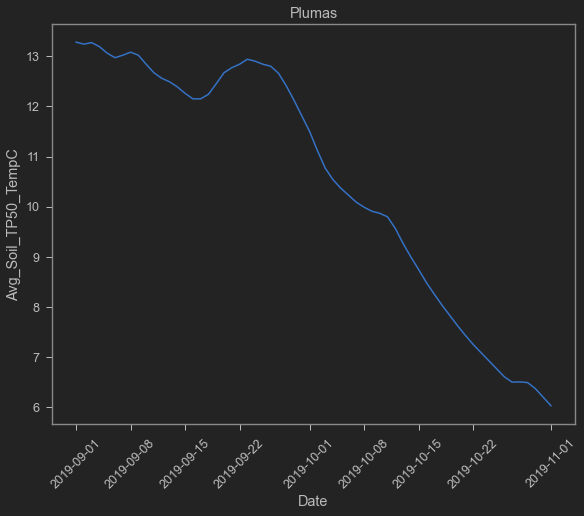

In [38]:
TimeseriesPlotSimple("Avg_Soil_TP50_TempC", "Plumas", df_timeseries_final)

In [39]:
df = df_timeseries_final.xs("Alexander", level="StationName", axis = 1)
df.loc["2019-11-01"] 

AvgAir_T_TempC          -2.714
MaxAir_T_TempC           1.763
MinAir_T_TempC          -9.570
Avg_Soil_TP05_TempC      0.420
Avg_Soil_TP20_TempC      3.141
Avg_Soil_TP50_TempC      5.328
Avg_Soil_TP100_TempC    10.040
Name: 2019-11-01 00:00:00, dtype: float64

In [40]:
def WaveletTransform(df,target_variables,walvelet_type,level):
    x = df.drop(target_variables, axis = 1)
    size = np.shape(x)
    length = (size[0] // (2**level)) * (2 ** level)
    start_point = size[0] - length
    x = x.iloc[start_point:].reset_index(drop = True)
    bigmats = []
    for i in x.columns:
        vec = x[i].values
        cAs_cDs = pywt.swt(vec, wavelet=walvelet_type, level=level,axis=0) 
        for j in cAs_cDs:
            bigmats.append(j[0])
            bigmats.append(j[1])

    
    features_num = len(bigmats)
    x = np.zeros((length, features_num))
    for i in range(0 ,len(bigmats)):
        for j in range(0,len(bigmats[0])):
            x[j,i] = x[j,i] + bigmats[i][j]
    
    y = df.iloc[start_point:].reset_index(drop = True)    
    x = pd.DataFrame(x)
    df = pd.concat([x,y],axis=1)
    return(df)

In [41]:
def Station(station_name):
    df = df_timeseries_final.xs(station_name, level="StationName", axis = 1)

    df_5 = df[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC", "Avg_Soil_TP05_TempC"]]
    df_20 = df[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC", "Avg_Soil_TP20_TempC"]]
    df_50 = df[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC", "Avg_Soil_TP50_TempC"]]
    df_100 = df[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC", "Avg_Soil_TP100_TempC"]]
    
    #################################################################################################
    df_5["Avg_Soil_TP05_TempC_Plus_1"] = df_5["Avg_Soil_TP05_TempC"].shift(-1)
    df_5["Avg_Soil_TP05_TempC_Plus_2"] = df_5["Avg_Soil_TP05_TempC"].shift(-2)

    df_5["AvgAir_T_TempC_Minus_6"] = df_5["AvgAir_T_TempC"].shift(6)
    df_5["AvgAir_T_TempC_Minus_5"] = df_5["AvgAir_T_TempC"].shift(5)
    df_5["AvgAir_T_TempC_Minus_4"] = df_5["AvgAir_T_TempC"].shift(4)
    df_5["AvgAir_T_TempC_Minus_3"] = df_5["AvgAir_T_TempC"].shift(3)
    df_5["AvgAir_T_TempC_Minus_2"] = df_5["AvgAir_T_TempC"].shift(2)
    df_5["AvgAir_T_TempC_Minus_1"] = df_5["AvgAir_T_TempC"].shift(1)

    df_5["MaxAir_T_TempC_Minus_6"] = df_5["MaxAir_T_TempC"].shift(6)
    df_5["MaxAir_T_TempC_Minus_5"] = df_5["MaxAir_T_TempC"].shift(5)
    df_5["MaxAir_T_TempC_Minus_4"] = df_5["MaxAir_T_TempC"].shift(4)
    df_5["MaxAir_T_TempC_Minus_3"] = df_5["MaxAir_T_TempC"].shift(3)
    df_5["MaxAir_T_TempC_Minus_2"] = df_5["MaxAir_T_TempC"].shift(2)
    df_5["MaxAir_T_TempC_Minus_1"] = df_5["MaxAir_T_TempC"].shift(1)


    df_5["MinAir_T_TempC_Minus_6"] = df_5["MinAir_T_TempC"].shift(6)
    df_5["MinAir_T_TempC_Minus_5"] = df_5["MinAir_T_TempC"].shift(5)
    df_5["MinAir_T_TempC_Minus_4"] = df_5["MinAir_T_TempC"].shift(4)
    df_5["MinAir_T_TempC_Minus_3"] = df_5["MinAir_T_TempC"].shift(3)
    df_5["MinAir_T_TempC_Minus_2"] = df_5["MinAir_T_TempC"].shift(2)
    df_5["MinAir_T_TempC_Minus_1"] = df_5["MinAir_T_TempC"].shift(1)


    df_5 = df_5[["AvgAir_T_TempC_Minus_6","MaxAir_T_TempC_Minus_6","MinAir_T_TempC_Minus_6",
          "AvgAir_T_TempC_Minus_5","MaxAir_T_TempC_Minus_5","MinAir_T_TempC_Minus_5",
          "AvgAir_T_TempC_Minus_4","MaxAir_T_TempC_Minus_4","MinAir_T_TempC_Minus_4",
          "AvgAir_T_TempC_Minus_3","MaxAir_T_TempC_Minus_3","MinAir_T_TempC_Minus_3",
          "AvgAir_T_TempC_Minus_2","MaxAir_T_TempC_Minus_2","MinAir_T_TempC_Minus_2",
          "AvgAir_T_TempC_Minus_1","MaxAir_T_TempC_Minus_1","MinAir_T_TempC_Minus_1",
          "AvgAir_T_TempC","MaxAir_T_TempC","MinAir_T_TempC",
          "Avg_Soil_TP05_TempC","Avg_Soil_TP05_TempC_Plus_1","Avg_Soil_TP05_TempC_Plus_2"]]

    df_5 = df_5.dropna(axis = 0)
#################################################################################

    df_20["Avg_Soil_TP20_TempC_Plus_1"] = df_20["Avg_Soil_TP20_TempC"].shift(-1)
    df_20["Avg_Soil_TP20_TempC_Plus_2"] = df_20["Avg_Soil_TP20_TempC"].shift(-2)

    df_20["AvgAir_T_TempC_Minus_6"] = df_20["AvgAir_T_TempC"].shift(6)
    df_20["AvgAir_T_TempC_Minus_5"] = df_20["AvgAir_T_TempC"].shift(5)
    df_20["AvgAir_T_TempC_Minus_4"] = df_20["AvgAir_T_TempC"].shift(4)
    df_20["AvgAir_T_TempC_Minus_3"] = df_20["AvgAir_T_TempC"].shift(3)
    df_20["AvgAir_T_TempC_Minus_2"] = df_20["AvgAir_T_TempC"].shift(2)
    df_20["AvgAir_T_TempC_Minus_1"] = df_20["AvgAir_T_TempC"].shift(1)

    df_20["MaxAir_T_TempC_Minus_6"] = df_20["MaxAir_T_TempC"].shift(6)
    df_20["MaxAir_T_TempC_Minus_5"] = df_20["MaxAir_T_TempC"].shift(5)
    df_20["MaxAir_T_TempC_Minus_4"] = df_20["MaxAir_T_TempC"].shift(4)
    df_20["MaxAir_T_TempC_Minus_3"] = df_20["MaxAir_T_TempC"].shift(3)
    df_20["MaxAir_T_TempC_Minus_2"] = df_20["MaxAir_T_TempC"].shift(2)
    df_20["MaxAir_T_TempC_Minus_1"] = df_20["MaxAir_T_TempC"].shift(1)


    df_20["MinAir_T_TempC_Minus_6"] = df_20["MinAir_T_TempC"].shift(6)
    df_20["MinAir_T_TempC_Minus_5"] = df_20["MinAir_T_TempC"].shift(5)
    df_20["MinAir_T_TempC_Minus_4"] = df_20["MinAir_T_TempC"].shift(4)
    df_20["MinAir_T_TempC_Minus_3"] = df_20["MinAir_T_TempC"].shift(3)
    df_20["MinAir_T_TempC_Minus_2"] = df_20["MinAir_T_TempC"].shift(2)
    df_20["MinAir_T_TempC_Minus_1"] = df_20["MinAir_T_TempC"].shift(1)


    df_20 = df_20[["AvgAir_T_TempC_Minus_6","MaxAir_T_TempC_Minus_6","MinAir_T_TempC_Minus_6",
          "AvgAir_T_TempC_Minus_5","MaxAir_T_TempC_Minus_5","MinAir_T_TempC_Minus_5",
          "AvgAir_T_TempC_Minus_4","MaxAir_T_TempC_Minus_4","MinAir_T_TempC_Minus_4",
          "AvgAir_T_TempC_Minus_3","MaxAir_T_TempC_Minus_3","MinAir_T_TempC_Minus_3",
          "AvgAir_T_TempC_Minus_2","MaxAir_T_TempC_Minus_2","MinAir_T_TempC_Minus_2",
          "AvgAir_T_TempC_Minus_1","MaxAir_T_TempC_Minus_1","MinAir_T_TempC_Minus_1",
          "AvgAir_T_TempC","MaxAir_T_TempC","MinAir_T_TempC",
          "Avg_Soil_TP20_TempC","Avg_Soil_TP20_TempC_Plus_1","Avg_Soil_TP20_TempC_Plus_2"]]

    df_20 = df_20.dropna(axis = 0)
####################################################################################

    df_50["Avg_Soil_TP50_TempC_Plus_1"] = df_50["Avg_Soil_TP50_TempC"].shift(-1)
    df_50["Avg_Soil_TP50_TempC_Plus_2"] = df_50["Avg_Soil_TP50_TempC"].shift(-2)

    df_50["AvgAir_T_TempC_Minus_6"] = df_50["AvgAir_T_TempC"].shift(6)
    df_50["AvgAir_T_TempC_Minus_5"] = df_50["AvgAir_T_TempC"].shift(5)
    df_50["AvgAir_T_TempC_Minus_4"] = df_50["AvgAir_T_TempC"].shift(4)
    df_50["AvgAir_T_TempC_Minus_3"] = df_50["AvgAir_T_TempC"].shift(3)
    df_50["AvgAir_T_TempC_Minus_2"] = df_50["AvgAir_T_TempC"].shift(2)
    df_50["AvgAir_T_TempC_Minus_1"] = df_50["AvgAir_T_TempC"].shift(1)

    df_50["MaxAir_T_TempC_Minus_6"] = df_50["MaxAir_T_TempC"].shift(6)
    df_50["MaxAir_T_TempC_Minus_5"] = df_50["MaxAir_T_TempC"].shift(5)
    df_50["MaxAir_T_TempC_Minus_4"] = df_50["MaxAir_T_TempC"].shift(4)
    df_50["MaxAir_T_TempC_Minus_3"] = df_50["MaxAir_T_TempC"].shift(3)
    df_50["MaxAir_T_TempC_Minus_2"] = df_50["MaxAir_T_TempC"].shift(2)
    df_50["MaxAir_T_TempC_Minus_1"] = df_50["MaxAir_T_TempC"].shift(1)


    df_50["MinAir_T_TempC_Minus_6"] = df_50["MinAir_T_TempC"].shift(6)
    df_50["MinAir_T_TempC_Minus_5"] = df_50["MinAir_T_TempC"].shift(5)
    df_50["MinAir_T_TempC_Minus_4"] = df_50["MinAir_T_TempC"].shift(4)
    df_50["MinAir_T_TempC_Minus_3"] = df_50["MinAir_T_TempC"].shift(3)
    df_50["MinAir_T_TempC_Minus_2"] = df_50["MinAir_T_TempC"].shift(2)
    df_50["MinAir_T_TempC_Minus_1"] = df_50["MinAir_T_TempC"].shift(1)


    df_50 = df_50[["AvgAir_T_TempC_Minus_6","MaxAir_T_TempC_Minus_6","MinAir_T_TempC_Minus_6",
          "AvgAir_T_TempC_Minus_5","MaxAir_T_TempC_Minus_5","MinAir_T_TempC_Minus_5",
          "AvgAir_T_TempC_Minus_4","MaxAir_T_TempC_Minus_4","MinAir_T_TempC_Minus_4",
          "AvgAir_T_TempC_Minus_3","MaxAir_T_TempC_Minus_3","MinAir_T_TempC_Minus_3",
          "AvgAir_T_TempC_Minus_2","MaxAir_T_TempC_Minus_2","MinAir_T_TempC_Minus_2",
          "AvgAir_T_TempC_Minus_1","MaxAir_T_TempC_Minus_1","MinAir_T_TempC_Minus_1",
          "AvgAir_T_TempC","MaxAir_T_TempC","MinAir_T_TempC",
          "Avg_Soil_TP50_TempC","Avg_Soil_TP50_TempC_Plus_1","Avg_Soil_TP50_TempC_Plus_2"]]

    df_50 = df_50.dropna(axis = 0)

###############################################################################

    df_100["Avg_Soil_TP100_TempC_Plus_1"] = df_100["Avg_Soil_TP100_TempC"].shift(-1)
    df_100["Avg_Soil_TP100_TempC_Plus_2"] = df_100["Avg_Soil_TP100_TempC"].shift(-2)

    df_100["AvgAir_T_TempC_Minus_6"] = df_100["AvgAir_T_TempC"].shift(6)
    df_100["AvgAir_T_TempC_Minus_5"] = df_100["AvgAir_T_TempC"].shift(5)
    df_100["AvgAir_T_TempC_Minus_4"] = df_100["AvgAir_T_TempC"].shift(4)
    df_100["AvgAir_T_TempC_Minus_3"] = df_100["AvgAir_T_TempC"].shift(3)
    df_100["AvgAir_T_TempC_Minus_2"] = df_100["AvgAir_T_TempC"].shift(2)
    df_100["AvgAir_T_TempC_Minus_1"] = df_100["AvgAir_T_TempC"].shift(1)

    df_100["MaxAir_T_TempC_Minus_6"] = df_100["MaxAir_T_TempC"].shift(6)
    df_100["MaxAir_T_TempC_Minus_5"] = df_100["MaxAir_T_TempC"].shift(5)
    df_100["MaxAir_T_TempC_Minus_4"] = df_100["MaxAir_T_TempC"].shift(4)
    df_100["MaxAir_T_TempC_Minus_3"] = df_100["MaxAir_T_TempC"].shift(3)
    df_100["MaxAir_T_TempC_Minus_2"] = df_100["MaxAir_T_TempC"].shift(2)
    df_100["MaxAir_T_TempC_Minus_1"] = df_100["MaxAir_T_TempC"].shift(1)


    df_100["MinAir_T_TempC_Minus_6"] = df_100["MinAir_T_TempC"].shift(6)
    df_100["MinAir_T_TempC_Minus_5"] = df_100["MinAir_T_TempC"].shift(5)
    df_100["MinAir_T_TempC_Minus_4"] = df_100["MinAir_T_TempC"].shift(4)
    df_100["MinAir_T_TempC_Minus_3"] = df_100["MinAir_T_TempC"].shift(3)
    df_100["MinAir_T_TempC_Minus_2"] = df_100["MinAir_T_TempC"].shift(2)
    df_100["MinAir_T_TempC_Minus_1"] = df_100["MinAir_T_TempC"].shift(1)


    df_100 = df_100[["AvgAir_T_TempC_Minus_6","MaxAir_T_TempC_Minus_6","MinAir_T_TempC_Minus_6",
          "AvgAir_T_TempC_Minus_5","MaxAir_T_TempC_Minus_5","MinAir_T_TempC_Minus_5",
          "AvgAir_T_TempC_Minus_4","MaxAir_T_TempC_Minus_4","MinAir_T_TempC_Minus_4",
          "AvgAir_T_TempC_Minus_3","MaxAir_T_TempC_Minus_3","MinAir_T_TempC_Minus_3",
          "AvgAir_T_TempC_Minus_2","MaxAir_T_TempC_Minus_2","MinAir_T_TempC_Minus_2",
          "AvgAir_T_TempC_Minus_1","MaxAir_T_TempC_Minus_1","MinAir_T_TempC_Minus_1",
          "AvgAir_T_TempC","MaxAir_T_TempC","MinAir_T_TempC",
          "Avg_Soil_TP100_TempC","Avg_Soil_TP100_TempC_Plus_1","Avg_Soil_TP100_TempC_Plus_2"]]

    df_100 = df_100.dropna(axis = 0)
######################################################################################################
    df_5_with_wavelet = WaveletTransform(df_5.reset_index(drop = True), ["Avg_Soil_TP05_TempC","Avg_Soil_TP05_TempC_Plus_1","Avg_Soil_TP05_TempC_Plus_2"], "db5", 5)
    df_20_with_wavelet = WaveletTransform(df_20.reset_index(drop = True), ["Avg_Soil_TP20_TempC","Avg_Soil_TP20_TempC_Plus_1","Avg_Soil_TP20_TempC_Plus_2"], "db5", 5)
    df_50_with_wavelet = WaveletTransform(df_50.reset_index(drop = True), ["Avg_Soil_TP50_TempC","Avg_Soil_TP50_TempC_Plus_1","Avg_Soil_TP50_TempC_Plus_2"], "db5", 5)
    df_100_with_wavelet = WaveletTransform(df_100.reset_index(drop = True), ["Avg_Soil_TP100_TempC","Avg_Soil_TP100_TempC_Plus_1","Avg_Soil_TP100_TempC_Plus_2"], "db5", 5)
    
    input_data = df_5_with_wavelet.drop(["Avg_Soil_TP05_TempC", "Avg_Soil_TP05_TempC_Plus_1", 
                        "Avg_Soil_TP05_TempC_Plus_2"], axis = 1).iloc[-1].values.reshape(1,231)
#     df = df_timeseries_final.xs("Alexander", level="StationName", axis = 1).loc["2019-09-29":"2019-11-01"]
    #5 cm
    scaler = pickle.load(open("Models/scaler_5cm_today.pkl", 'rb'))
    model = pickle.load(open("Models/model_5cm_today.pkl", 'rb'))  
    scaled_data = scaler.transform(input_data)
    today_5 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_5cm_tomorrow.pkl", 'rb'))
    model = load_model("Models/model_5cm_tomorrow.h5")
    scaled_data = scaler.transform(input_data)
    tomorrow_5 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_5cm_day_after_tomorrow.pkl", 'rb'))
    model = pickle.load(open("Models/model_5cm_day_after_tomorrow.pkl", 'rb'))  
    scaled_data = scaler.transform(input_data)
    day_after_tomorrow_5 = model.predict(scaled_data).item()

    df.at['2019-10-30', 'Avg_Soil_TP05_TempC_predicted'] = today_5
    df.at['2019-10-31', 'Avg_Soil_TP05_TempC_predicted'] = tomorrow_5
    df.at['2019-11-01', 'Avg_Soil_TP05_TempC_predicted'] = day_after_tomorrow_5
    
    #20
    
    scaler = pickle.load(open("Models/scaler_20cm_today.pkl", 'rb'))
    model = pickle.load(open("Models/model_20cm_today.pkl", 'rb'))  
    scaled_data = scaler.transform(input_data)
    today_20 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_20cm_tomorrow.pkl", 'rb'))
    model = pickle.load(open("Models/model_20cm_tomorrow.pkl", 'rb'))
    scaled_data = scaler.transform(input_data)
    tomorrow_20 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_20cm_day_after_tomorrow.pkl", 'rb'))
    model = pickle.load(open("Models/model_20cm_day_after_tomorrow.pkl", 'rb'))  
    scaled_data = scaler.transform(input_data)
    day_after_tomorrow_20 = model.predict(scaled_data).item()

    df.at['2019-10-30', 'Avg_Soil_TP20_TempC_predicted'] = today_20
    df.at['2019-10-31', 'Avg_Soil_TP20_TempC_predicted'] = tomorrow_20
    df.at['2019-11-01', 'Avg_Soil_TP20_TempC_predicted'] = day_after_tomorrow_20

    #50 cm

    scaler = pickle.load(open("Models/scaler_50cm_today.pkl", 'rb'))
    model  = load_model("Models/model_50cm_today.h5") 
    scaled_data = scaler.transform(input_data)
    today_50 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_50cm_tomorrow.pkl", 'rb'))
    model = pickle.load(open("Models/model_50cm_tomorrow.pkl", 'rb'))
    scaled_data = scaler.transform(input_data)
    tomorrow_50 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_50cm_day_after_tomorrow.pkl", 'rb'))
    model = pickle.load(open("Models/model_50cm_day_after_tomorrow.pkl", 'rb'))  
    scaled_data = scaler.transform(input_data)
    day_after_tomorrow_50 = model.predict(scaled_data).item()

    df.at['2019-10-30', 'Avg_Soil_TP50_TempC_predicted'] = today_50
    df.at['2019-10-31', 'Avg_Soil_TP50_TempC_predicted'] = tomorrow_50
    df.at['2019-11-01', 'Avg_Soil_TP50_TempC_predicted'] = day_after_tomorrow_50
    
    #100 cm
    scaler = pickle.load(open("Models/scaler_100cm_today.pkl", 'rb'))
    model = load_model("Models/model_100cm_today.h5") 
    scaled_data = scaler.transform(input_data)
    today_100 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_100cm_tomorrow.pkl", 'rb'))
    model = load_model("Models/model_100cm_today.h5") 
    scaled_data = scaler.transform(input_data)
    tomorrow_100 = model.predict(scaled_data).item()

    scaler = pickle.load(open("Models/scaler_100cm_day_after_tomorrow.pkl", 'rb'))
    model = load_model("Models/model_100cm_today.h5") 
    scaled_data = scaler.transform(input_data)
    day_after_tomorrow_100 = model.predict(scaled_data).item()

    df.at['2019-10-30', 'Avg_Soil_TP100_TempC_predicted'] = today_100
    df.at['2019-10-31', 'Avg_Soil_TP100_TempC_predicted'] = tomorrow_100
    df.at['2019-11-01', 'Avg_Soil_TP100_TempC_predicted'] = day_after_tomorrow_100
    
    
    df = df[["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC","Avg_Soil_TP05_TempC",
             "Avg_Soil_TP05_TempC_predicted", "Avg_Soil_TP20_TempC", "Avg_Soil_TP20_TempC_predicted",
             "Avg_Soil_TP50_TempC" ,"Avg_Soil_TP50_TempC_predicted", "Avg_Soil_TP100_TempC","Avg_Soil_TP100_TempC_predicted"]]
##############################################################################################    
    fig, axes = plt.subplots(4,1,figsize=(12,15))
    axes[0].plot(df["AvgAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Avg air Temp C")
    axes[0].plot(df["MaxAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Max air Temp C")
    axes[0].plot(df["MinAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Min air Temp C")
    axes[0].plot(df["Avg_Soil_TP05_TempC"].loc["2019-10-30":"2019-11-01"], label = "Avg soil Temp C")
    axes[0].plot(df["Avg_Soil_TP05_TempC_predicted"], label = "Predicted Avg soil Temp C")
    axes[0].set_title(f"{station_name}: Depth = 5cm")
    axes[0].legend()


    axes[1].plot(df["AvgAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Avg air Temp C")
    axes[1].plot(df["MaxAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Max air Temp C")
    axes[1].plot(df["MinAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Min air Temp C")
    axes[1].plot(df["Avg_Soil_TP20_TempC"].loc["2019-10-30":"2019-11-01"], label = "Avg soil Temp C")
    axes[1].plot(df["Avg_Soil_TP20_TempC_predicted"], label = "Predicted Avg soil Temp C")
    axes[1].set_title(f"{station_name}: Depth = 20cm")
    axes[1].legend()


    axes[2].plot(df["AvgAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Avg air Temp C")
    axes[2].plot(df["MaxAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Max air Temp C")
    axes[2].plot(df["MinAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Min air Temp C")
    axes[2].plot(df["Avg_Soil_TP50_TempC"].loc["2019-10-30":"2019-11-01"], label = "Avg soil Temp C")
    axes[2].plot(df["Avg_Soil_TP50_TempC_predicted"], label = "Predicted Avg soil Temp C")
    axes[2].set_title(f"{station_name}: Depth = 50cm")
    axes[2].legend()


    axes[3].plot(df["AvgAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Avg air Temp C")
    axes[3].plot(df["MaxAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Max air Temp C")
    axes[3].plot(df["MinAir_T_TempC"].loc["2019-10-25":"2019-10-30"], label = "Min air Temp C")
    axes[3].plot(df["Avg_Soil_TP100_TempC"].loc["2019-10-30":"2019-11-01"], label = "Avg soil Temp C")
    axes[3].plot(df["Avg_Soil_TP100_TempC_predicted"], label = "Predicted Avg soil Temp C")
    axes[3].set_title(f"{station_name}: Depth = 100cm")
    axes[3].legend()

    plt.tight_layout()
    fig.tight_layout() 

    print(fig)
    return df
    

In [42]:
import warnings
warnings.filterwarnings("ignore")

In [43]:
base_map

Figure(864x1080)


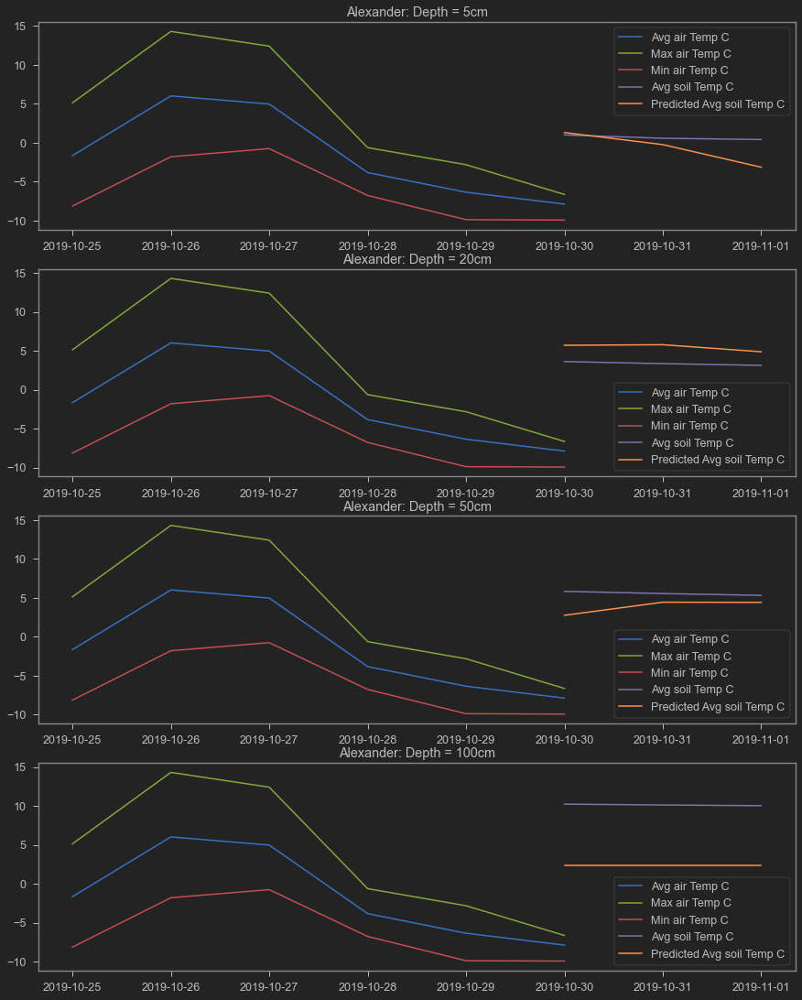

In [44]:
station = Station("Alexander")


In [45]:
df = station.dropna().drop(["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC"], axis = 1).reset_index()
columns = df.columns

Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


Figure(864x1080)
Figure(864x1080)


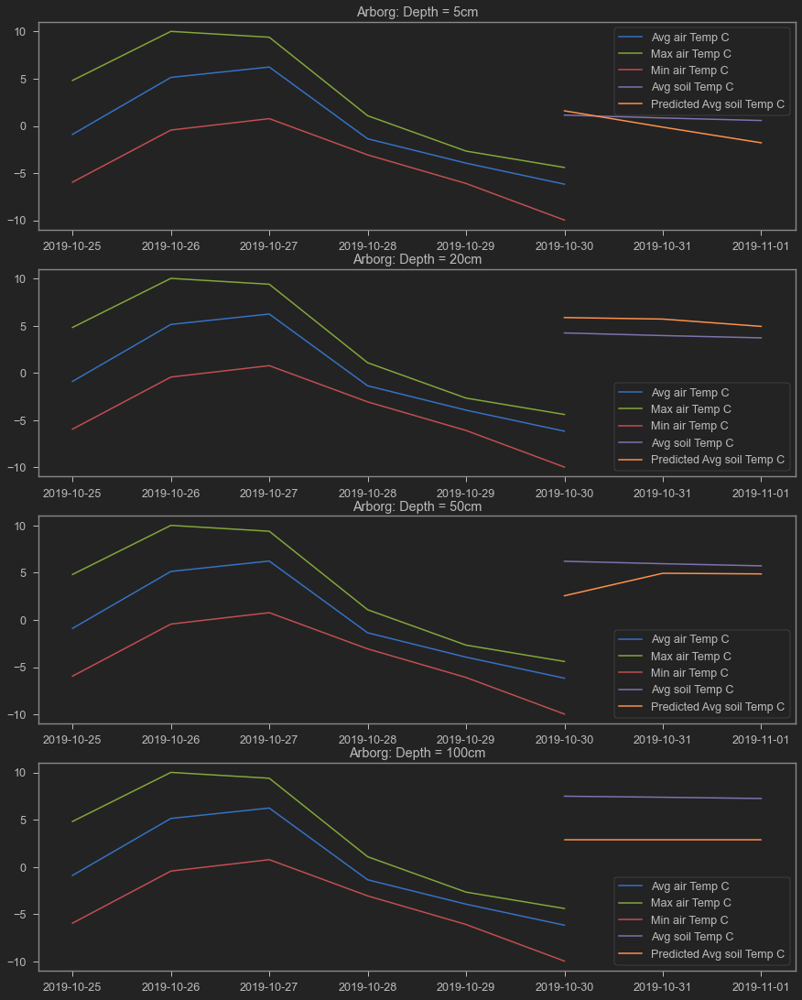

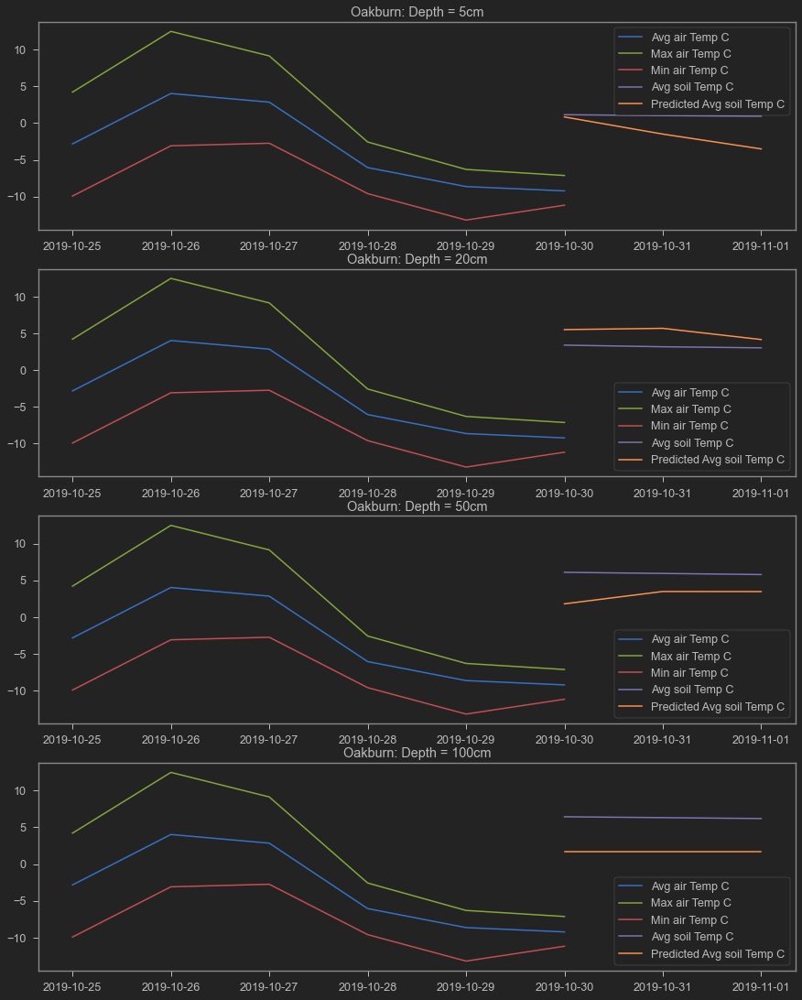

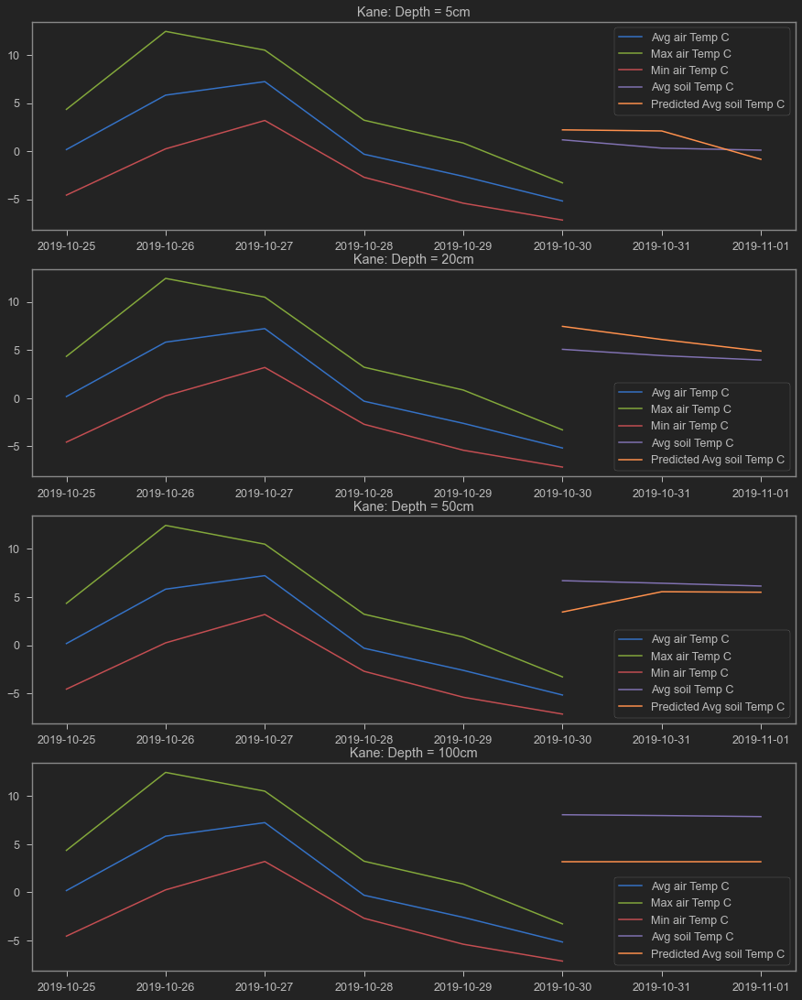

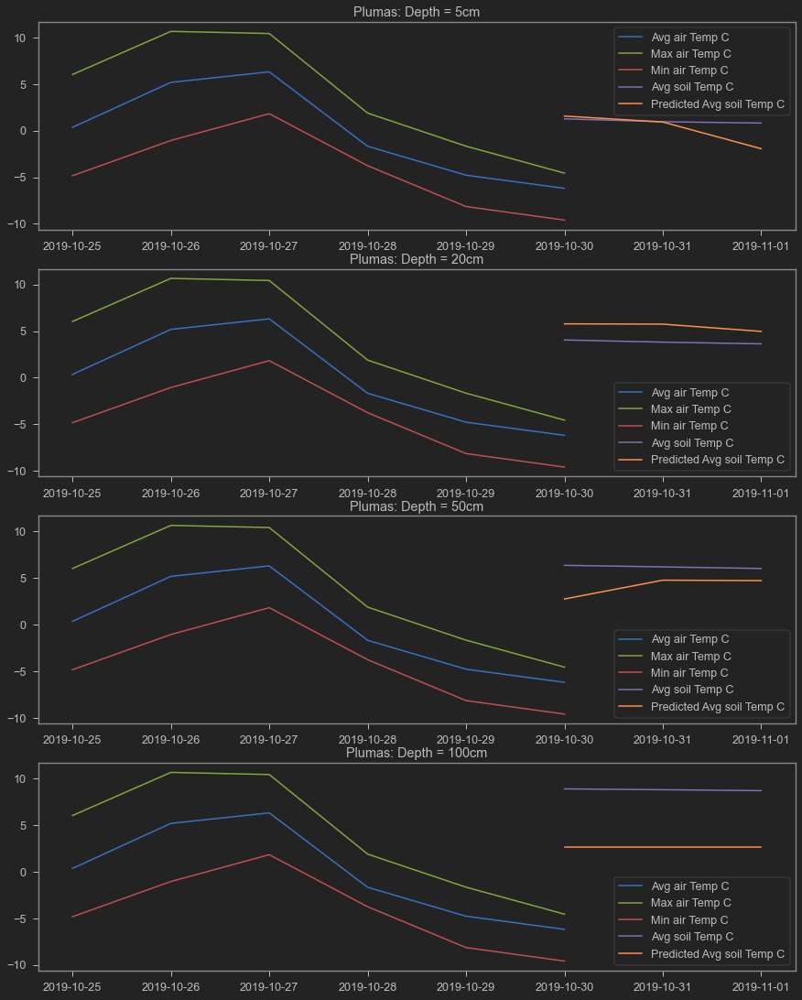

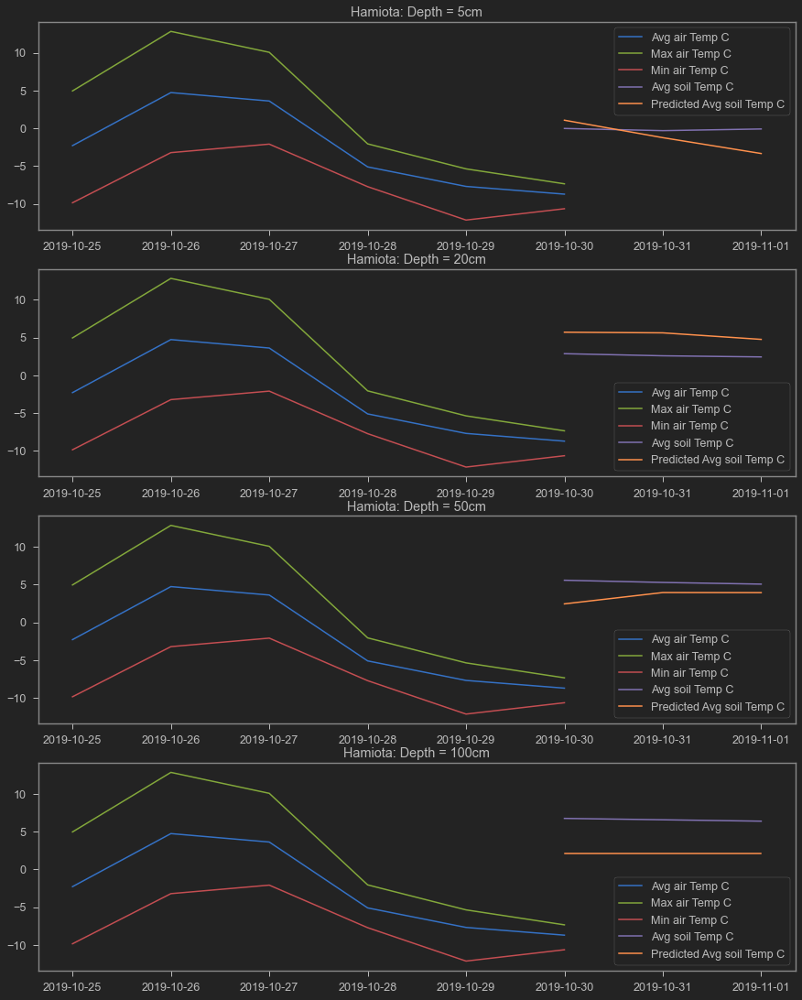

...

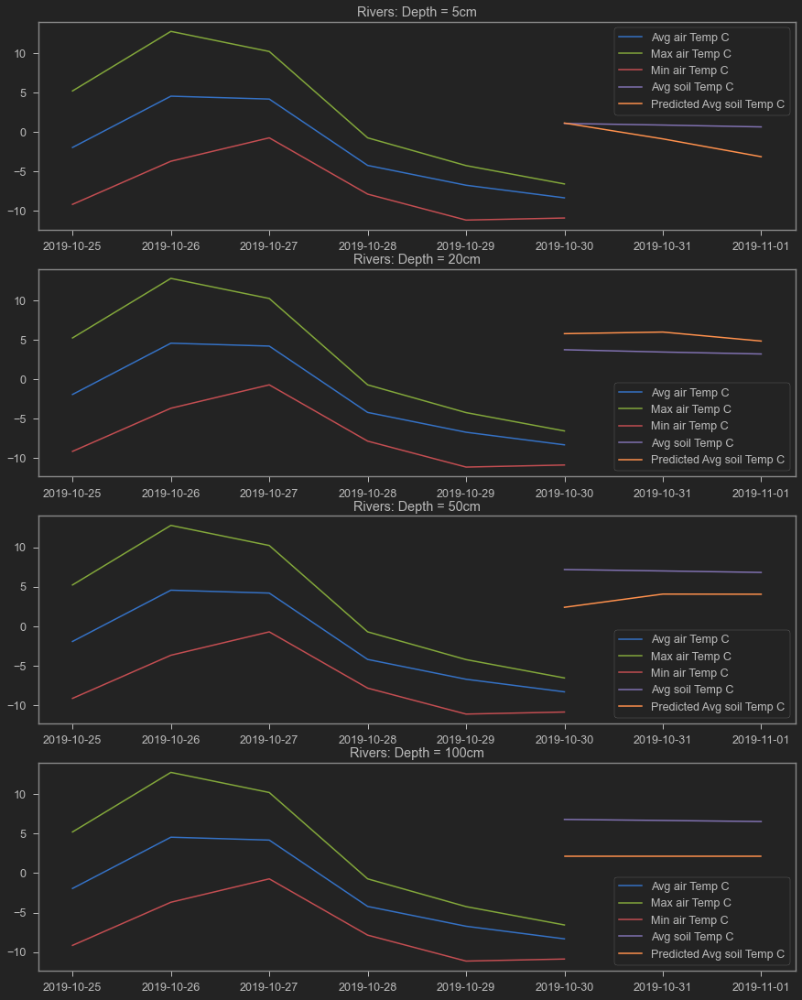

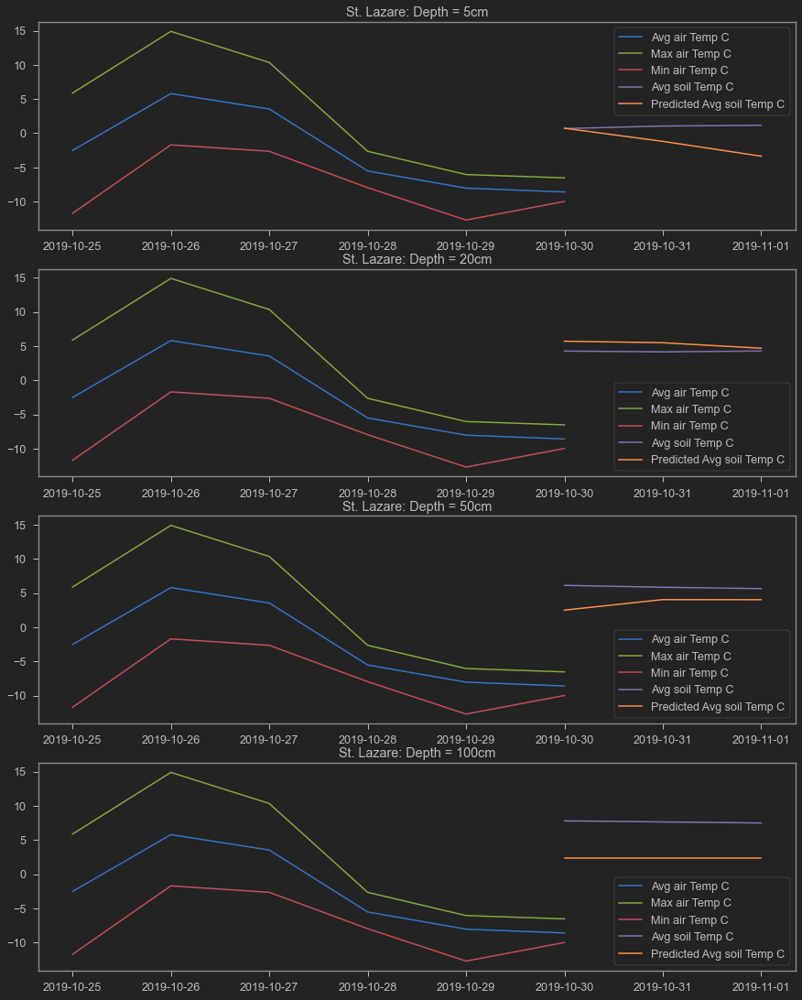

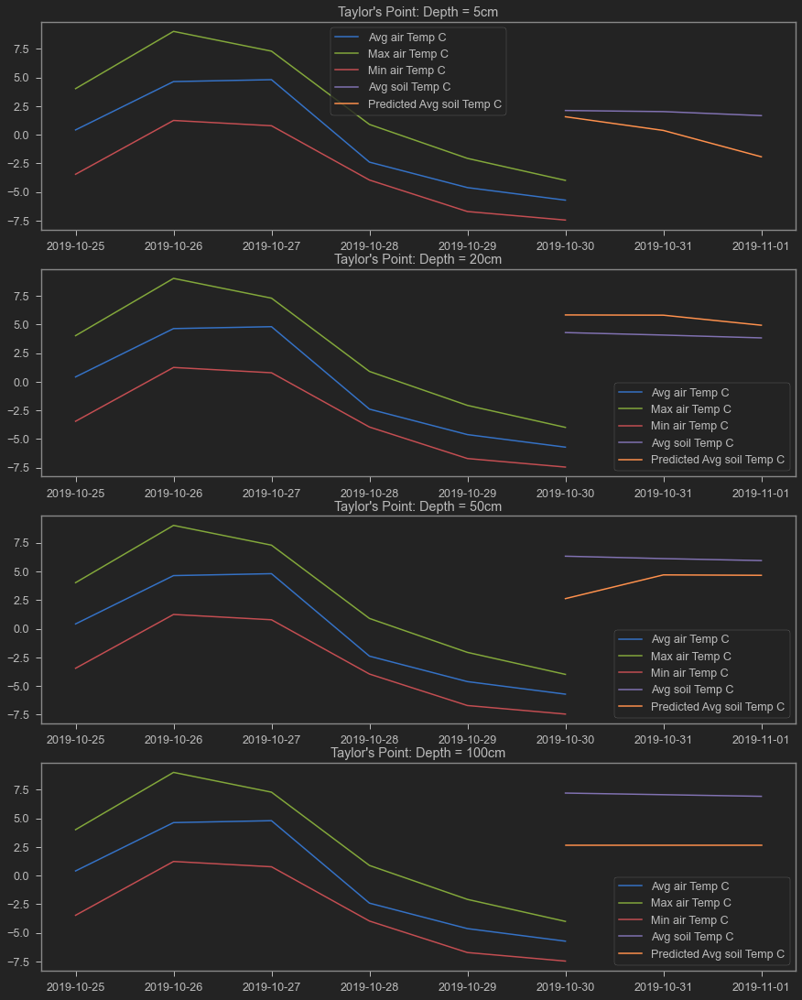

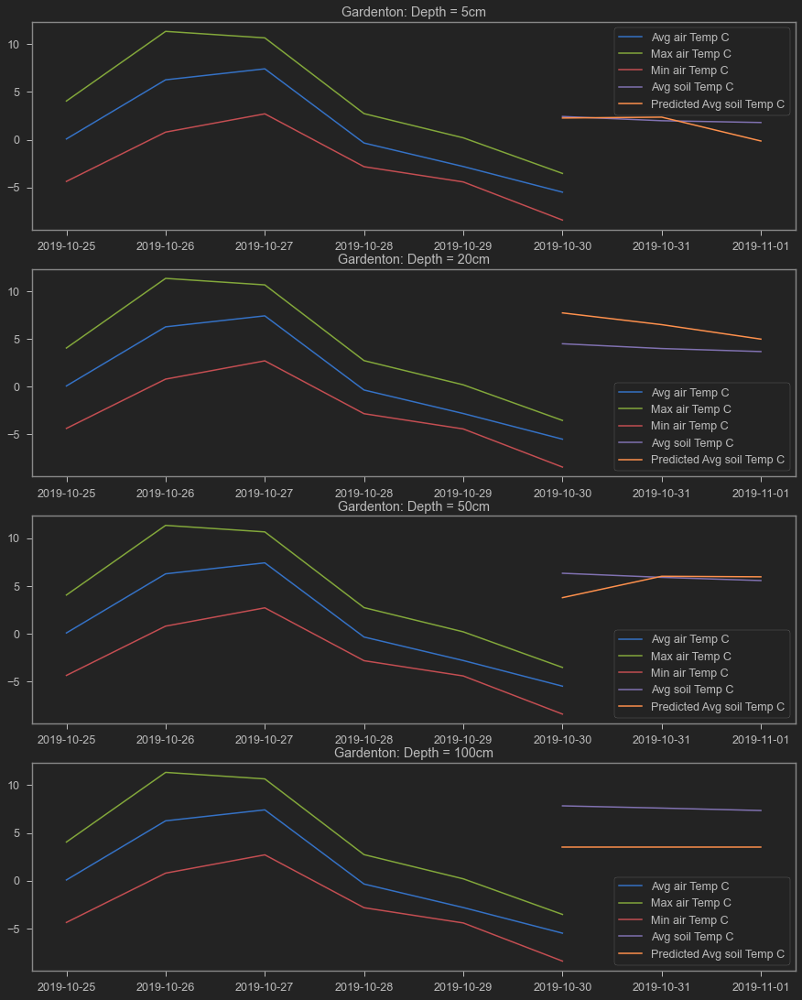

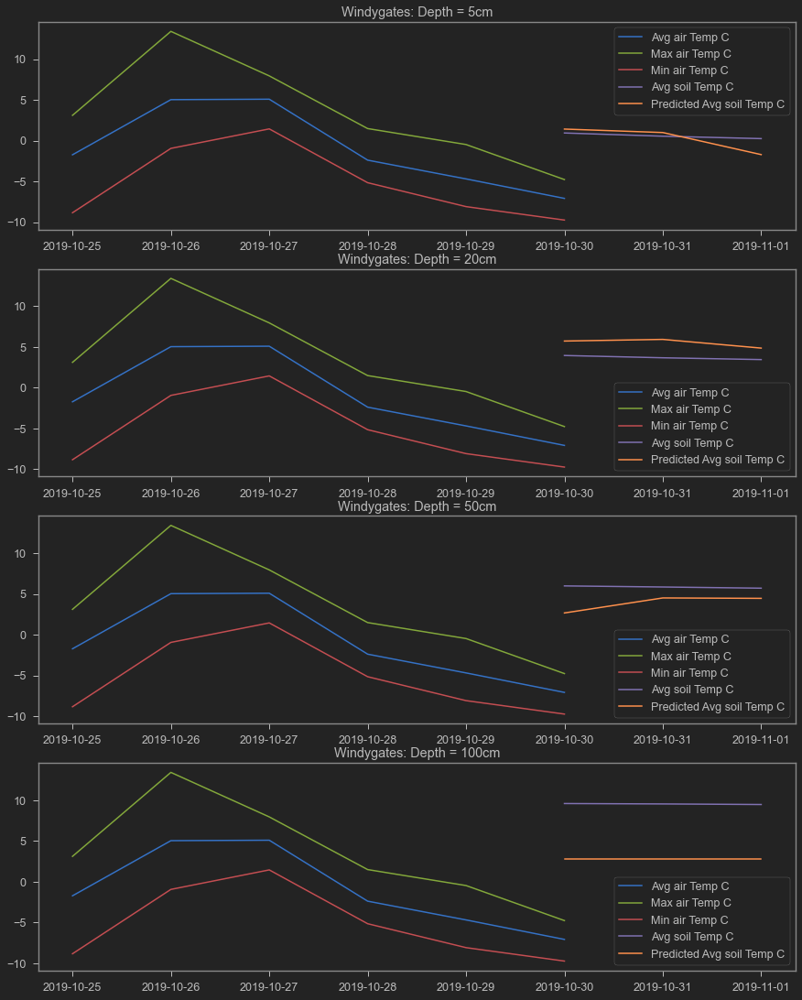

In [46]:
df_map = pd.DataFrame(columns = columns)
for i in final_station_names:
    station = Station(i).copy()
    df = station.dropna().drop(["AvgAir_T_TempC", "MaxAir_T_TempC", "MinAir_T_TempC"], axis = 1)
    df
    df.at["2019-10-30","StationName"] = i
    df.at["2019-10-31","StationName"] = i
    df.at["2019-11-01","StationName"] = i
    df = df.reset_index()
    frames = [df_map, df]
    df_map = pd.concat(frames, sort=False)

In [47]:
df_map_final = df_map.merge(df_meta_data_fianl, on = "StationName")
df_map_final = df_map_final[["StationName", "lat", "lon", "date", "Avg_Soil_TP05_TempC","Avg_Soil_TP05_TempC_predicted","Avg_Soil_TP20_TempC",
              "Avg_Soil_TP20_TempC_predicted","Avg_Soil_TP50_TempC","Avg_Soil_TP50_TempC_predicted","Avg_Soil_TP100_TempC",
              "Avg_Soil_TP100_TempC_predicted"]]
df_map_final

,StationName,lat,lon,date,Avg_Soil_TP05_TempC,Avg_Soil_TP05_TempC_predicted,Avg_Soil_TP20_TempC,Avg_Soil_TP20_TempC_predicted,Avg_Soil_TP50_TempC,Avg_Soil_TP50_TempC_predicted,Avg_Soil_TP100_TempC,Avg_Soil_TP100_TempC_predicted
0,Arborg,50.904,-97.273,2019-10-30,1.153,1.608489,4.244,5.871714,6.220,2.567799,7.498,2.909248
1,Arborg,50.904,-97.273,2019-10-31,0.850,-0.120689,3.965,5.711188,5.962,4.950042,7.388,2.909248
2,Arborg,50.904,-97.273,2019-11-01,0.583,-1.778847,3.721,4.937838,5.736,4.881827,7.257,2.909248
3,Oakburn,50.595,-100.672,2019-10-30,1.139,0.832080,3.397,5.510261,6.093,1.802972,6.441,1.729917
4,Oakburn,50.595,-100.672,2019-10-31,1.018,-1.498829,3.174,5.681343,5.941,3.484020,6.323,1.729917
...,...,...,...,...,...,...,...,...,...,...,...,...
250,Gardenton,49.088,-96.640,2019-10-31,1.988,2.362513,3.998,6.498307,5.901,6.014651,7.603,3.538759
251,Gardenton,49.088,-96.640,2019-11-01,1.801,-0.134970,3.680,4.983738,5.565,5.958547,7.350,3.538759
252,Windygates,49.008,-98.380,2019-10-30,0.944,1.423801,3.950,5.721881,5.985,2.666641,9.590,2.774185
253,Windygates,49.008,-98.380,2019-10-31,0.549,0.999078,3.668,5.924516,5.851,4.508131,9.540,2.774185


In [48]:
df_map_final.to_csv('results/df_map_final.csv', index = False)

# Presentation

In [49]:
base_map

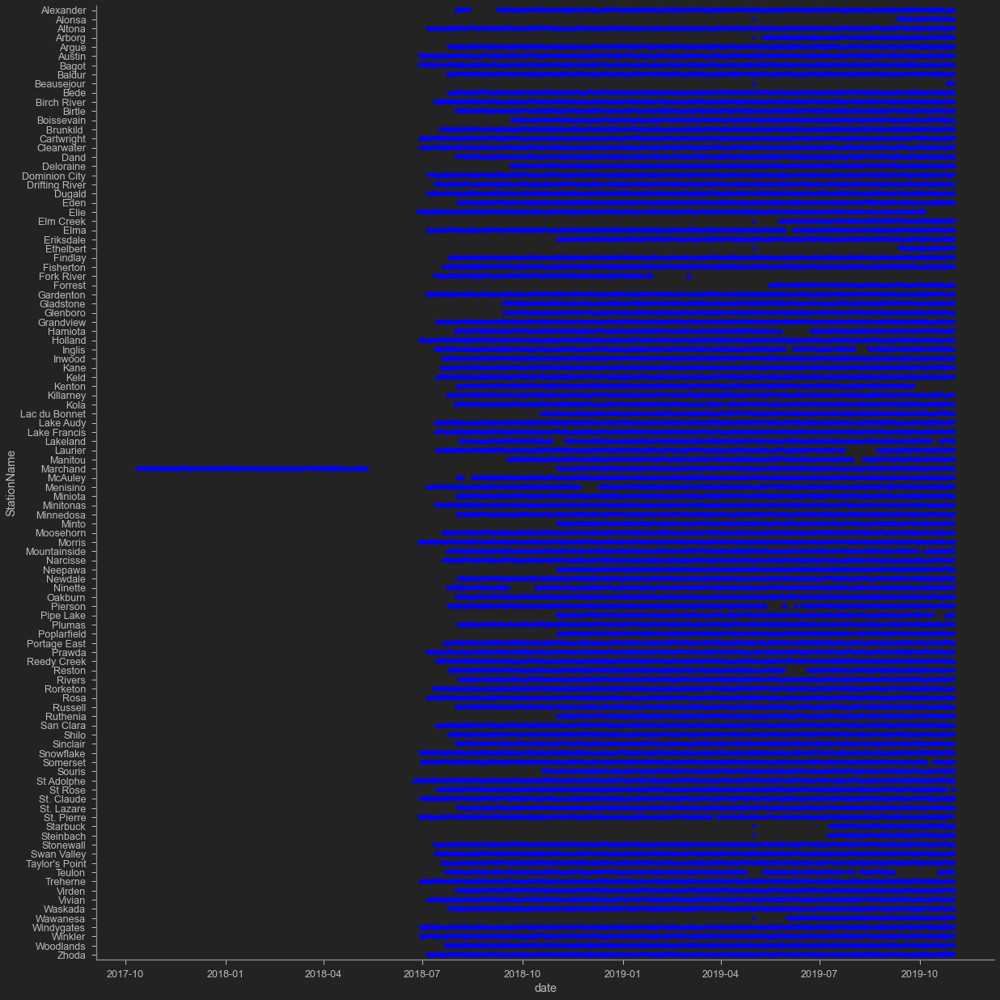

In [50]:
fig_city_timeseries = sns.catplot(y = "StationName", x = "date", data = df_final.sort_values("StationName"),
                                  aspect = 1, height = 17, color = "blue")
fig_city_timeseries

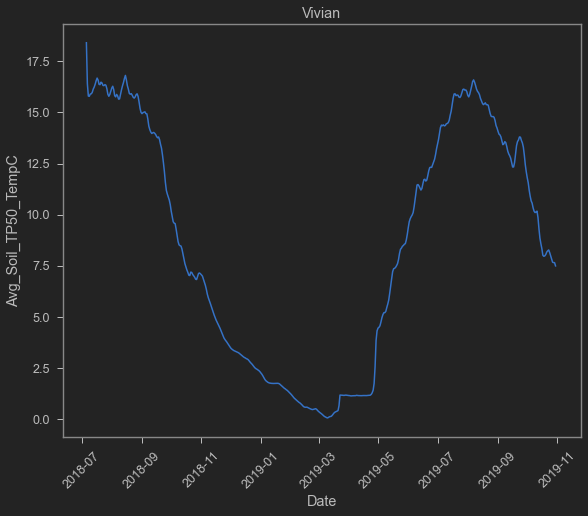

In [51]:
TimeseriesPlotSimple("Avg_Soil_TP50_TempC", "Vivian", df_timeseries)

## "2019-9-1":"2019-11-01": lets assume today is 2019-10-30

In [52]:
final_station_names

['Arborg',
 'Oakburn',
 'Kane',
 'Plumas',
 'Hamiota',
 'Alexander',
 'Gladstone',
 'Eden',
 'Virden',
 'Austin',
 'Prawda',
 'Miniota',
 'Grandview',
 'Sinclair',
 'Poplarfield',
 'Bagot',
 'Zhoda',
 'Birch River',
 'Findlay',
 'Manitou',
 'Shilo',
 'Laurier',
 'Stonewall',
 'Snowflake',
 'Waskada',
 'Boissevain',
 'Starbuck',
 'Ruthenia',
 'Baldur',
 'Menisino',
 'Wawanesa',
 'Elma',
 'Holland',
 'Portage East',
 'San Clara',
 'Glenboro',
 'Minitonas',
 'Marchand',
 'Minto',
 'Russell',
 'Kola',
 'Bede',
 'Woodlands',
 'St Adolphe',
 'Argue',
 'Clearwater',
 'Keld',
 'Deloraine',
 'Inwood',
 'McAuley',
 'Elm Creek',
 'Killarney',
 'Dominion City',
 'Forrest',
 'Dand',
 'Souris',
 'Ninette',
 'Inglis',
 'Morris',
 'Neepawa',
 'Altona',
 'Narcisse',
 'Newdale',
 'Minnedosa',
 'Pierson',
 'Swan Valley',
 'Fisherton',
 'Lake Francis',
 'Moosehorn',
 'Rorketon',
 'Treherne',
 'Drifting River',
 'Lac du Bonnet',
 'Steinbach',
 'Rosa',
 'Birtle',
 'Cartwright',
 'Eriksdale',
 'Reedy Creek',

Figure(864x1080)


,AvgAir_T_TempC,MaxAir_T_TempC,MinAir_T_TempC,Avg_Soil_TP05_TempC,Avg_Soil_TP05_TempC_predicted,Avg_Soil_TP20_TempC,Avg_Soil_TP20_TempC_predicted,Avg_Soil_TP50_TempC,Avg_Soil_TP50_TempC_predicted,Avg_Soil_TP100_TempC,Avg_Soil_TP100_TempC_predicted
date,,,,,,,,,,,
2019-09-01,16.810,24.400,11.340,16.530,NaN,13.710,NaN,12.970,NaN,12.110,NaN
2019-09-02,16.020,21.030,11.160,16.730,NaN,14.300,NaN,12.950,NaN,12.050,NaN
2019-09-03,11.720,15.850,8.900,14.970,NaN,13.800,NaN,13.020,NaN,12.030,NaN
2019-09-04,12.740,17.530,7.640,15.350,NaN,13.350,NaN,12.960,NaN,12.020,NaN
2019-09-05,14.750,23.830,5.173,14.760,NaN,13.100,NaN,12.840,NaN,12.000,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2019-10-28,-4.196,-1.461,-6.472,2.642,NaN,4.737,NaN,6.678,NaN,7.469,NaN
2019-10-29,-6.833,-1.593,-11.480,1.460,NaN,4.107,NaN,6.569,NaN,7.392,NaN
2019-10-30,-8.190,-6.451,-11.030,0.878,1.041286,2.999,5.663352,6.348,3.058701,7.291,2.519875


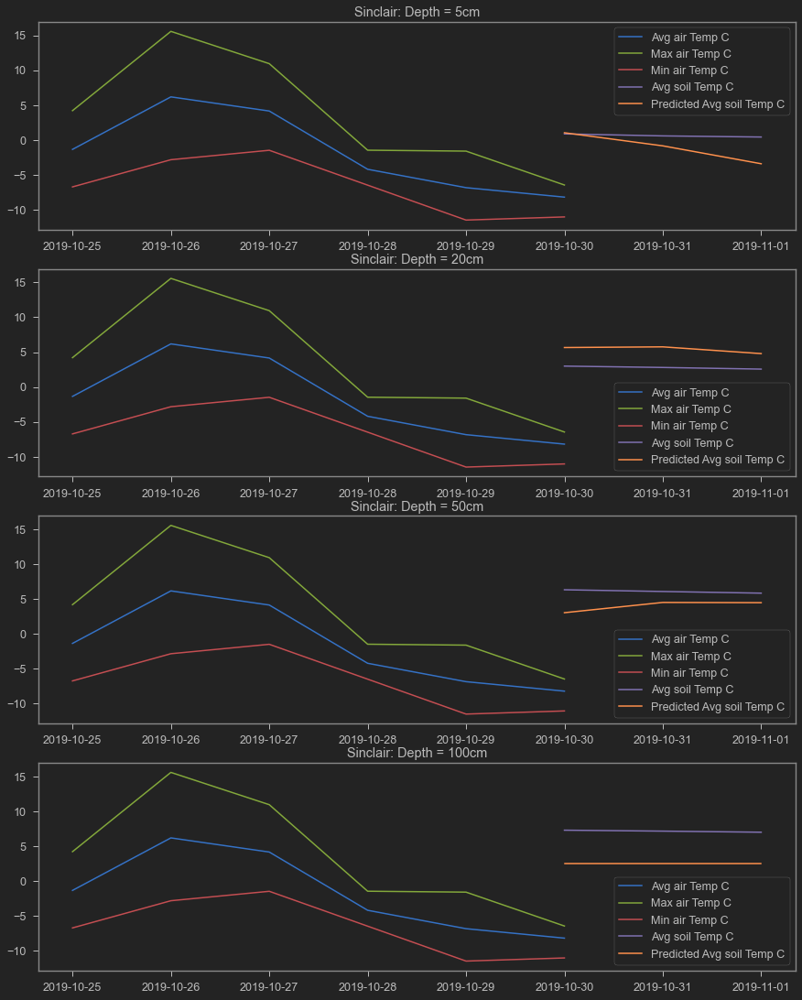

In [53]:
station = Station("Sinclair")
station